**Objective:** The task is to detect motion of the needle in a pressure gauge. 

**Approach:** 
- The pressure gauge occupies a small portion of the full image. 
- Here it will be interesting to see if any foundation model can detect pressure gauge out of the box.
- As it is a static camera video, we need to detect bbox for gauge only once for each sample scenario. 
- Once bbox is detected, series of crops from all video frames can be taken and we can then apply some MV techniques to jude if the gauge is moving or not.

In [1]:
# Ensure edits to libraries are loaded and plotting is shown in the notebook.
%reload_ext autoreload
%autoreload 2
# %matplotlib inlinepython

In [2]:
import os 
os.chdir("..")
os.getcwd()

'/mnt/ai-storage/personal/pradip/diffusion'

In [3]:
os.environ['HF_HOME'] = './data'

In [4]:
import cv2
import matplotlib.pyplot as plt
import re
import numpy as np
from PIL import Image
import copy

# Pressure gauge localisation using vision foundation models

## Paligemma

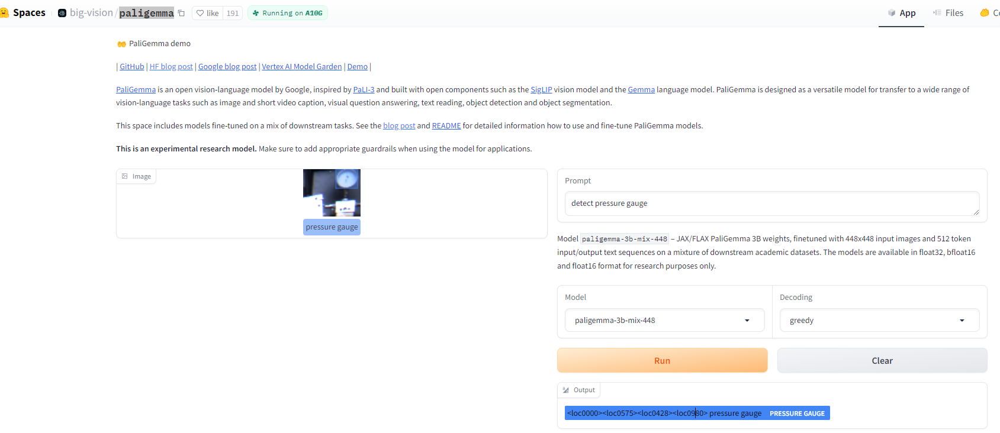

## Load raw videos and extract sample frames

First we will load both the videos and extract sample frames from each

In [5]:
sample1_video_path = './data/pressure_gauge/needle_encoded.mp4'

In [6]:
sample1_cap = cv2.VideoCapture(sample1_video_path)

In [7]:
frame_index = 40
# Set the frame index
sample1_cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)

True

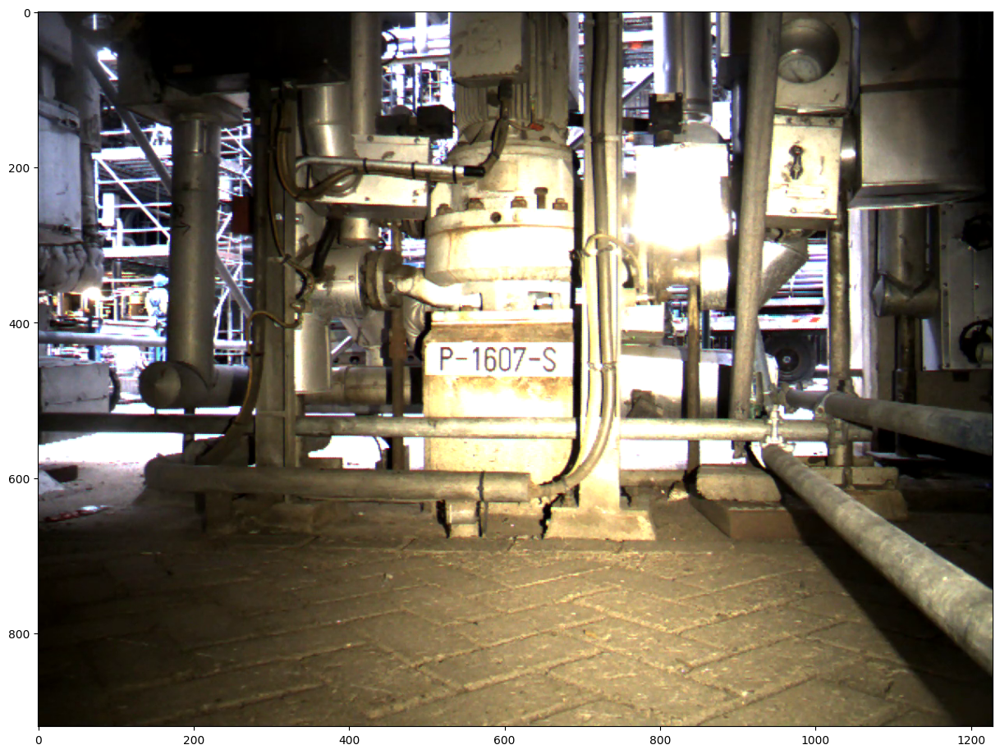

In [8]:
# Read the frame
ret, sample1_frame = sample1_cap.read()
sample1_frame = cv2.cvtColor(sample1_frame, cv2.COLOR_BGR2RGB) 
plt.figure(figsize=(15,15))
plt.imshow(sample1_frame)

In [9]:
sample2_video_path = './data/pressure_gauge/needle2_encoded.mp4'
sample2_cap = cv2.VideoCapture(sample2_video_path)
print(f"total frames from pano video: {sample2_cap.get(cv2.CAP_PROP_FRAME_COUNT)}")

total frames from pano video: 208.0


In [10]:
frame_index = 40
# Set the frame index
sample2_cap.set(cv2.CAP_PROP_POS_FRAMES, frame_index)

True

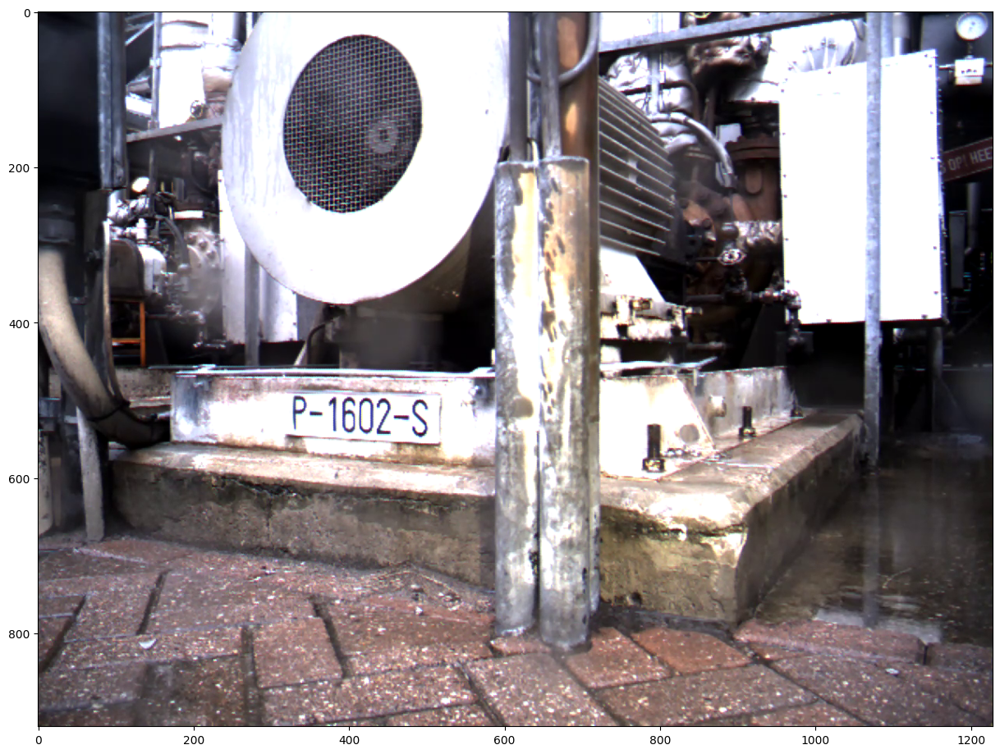

In [11]:
# Read the frame
ret, sample2_frame = sample2_cap.read()
sample2_frame = cv2.cvtColor(sample2_frame, cv2.COLOR_BGR2RGB) 
plt.figure(figsize=(15,15))
plt.imshow(sample2_frame)

## Paligemma Inference

### Setup Paligemma model

- Load the paligemma model using hf access token
- I have written a custom script to easily looad the model from hf and do single/sliced inference

In [17]:
from src.paligemma.inference import Paligemma

In [14]:
access_token = os.getenv('HF_TOKEN')

In [18]:
paligemma_model = Paligemma(model_id="google/paligemma-3b-mix-448",
                            access_token=access_token)

`config.hidden_act` is ignored, you should use `config.hidden_activation` instead.
Gemma's activation function will be set to `gelu_pytorch_tanh`. Please, use
`config.hidden_activation` if you want to override this behaviour.
See https://github.com/huggingface/transformers/pull/29402 for more details.
Loading checkpoint shards: 100%|██████████| 3/3 [00:02<00:00,  1.48it/s]


### Single Image inference

- We know full size image inference won't work as the model we are using will resize the input to 448x448, and in that resolution model may not be able to detect the pressure gauge
- So we will try to detect gauge using sliced inferencing, i.e. we will define slices of the input frame and send each slice for inference. 
- Here we will also explore different prompts i.e. detection and segmentation related.

#### Video-1

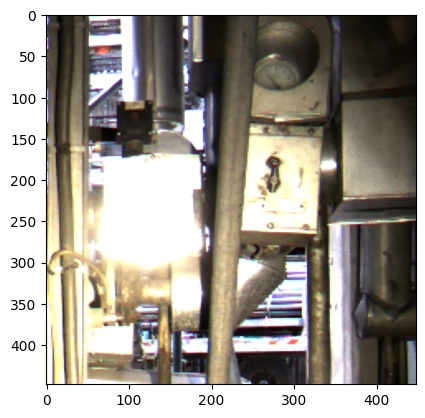

In [19]:
v_start = 0
h_sart = 700
slice_size = 448
slice_image = copy.deepcopy(sample1_frame[v_start:v_start+slice_size, h_sart:h_sart+slice_size])
plt.imshow(slice_image)

In [20]:
raw_image = Image.fromarray(slice_image)
result = paligemma_model.run_inference(raw_image, prompt='segment gauge')
result

[{'content': '<loc0000><loc0558><loc0234><loc0784><seg023><seg068><seg078><seg029><seg020><seg038><seg041><seg082><seg086><seg022><seg071><seg029><seg042><seg095><seg027><seg003>',
  'xyxy': (244, 0, 343, 102),
  'mask': array([[0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         ...,
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.],
         [0., 0., 0., ..., 0., 0., 0.]]),
  'name': None},
 {'content': '<seg056>'}]

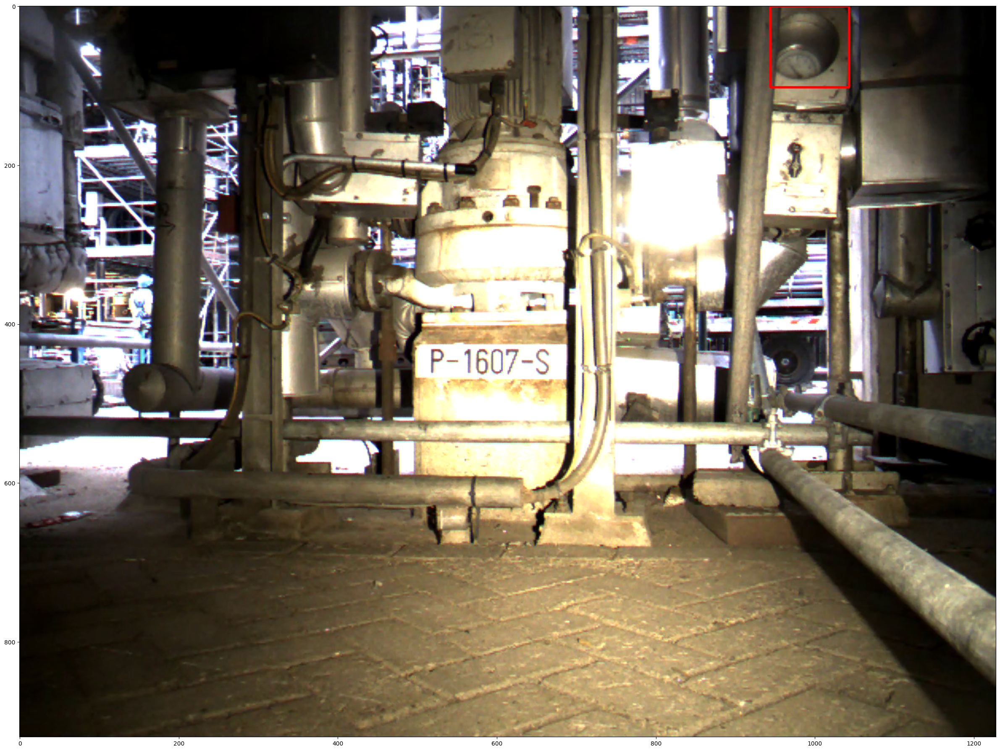

In [21]:
overlay = copy.deepcopy(sample1_frame)
x1, y1, x2, y2 = result[0]['xyxy']
x1_new, y1_new, x2_new, y2_new = x1+h_sart, y1+v_start, x2+h_sart, y2+v_start
cv2.rectangle(overlay, (int(x1_new), int(y1_new)), (int(x2_new), int(y2_new)), (255,0,0), 2) 
plt.figure(figsize=(30,30))
plt.imshow(overlay)

In [22]:
sample1_bbox = [x1_new, y1_new, x2_new, y2_new]
sample1_bbox # [944, 0, 1043, 102]

[944, 0, 1043, 102]

In [23]:
mask = (result[0]['mask'] * 255).astype(np.uint8)
_, binary_mask = cv2.threshold(mask, 127, 255, cv2.THRESH_BINARY)
mask = cv2.merge([binary_mask, binary_mask, binary_mask])

In [24]:
full_mask = np.zeros_like(sample1_frame)
full_mask[v_start:v_start+slice_size,h_sart:h_sart+slice_size] = mask

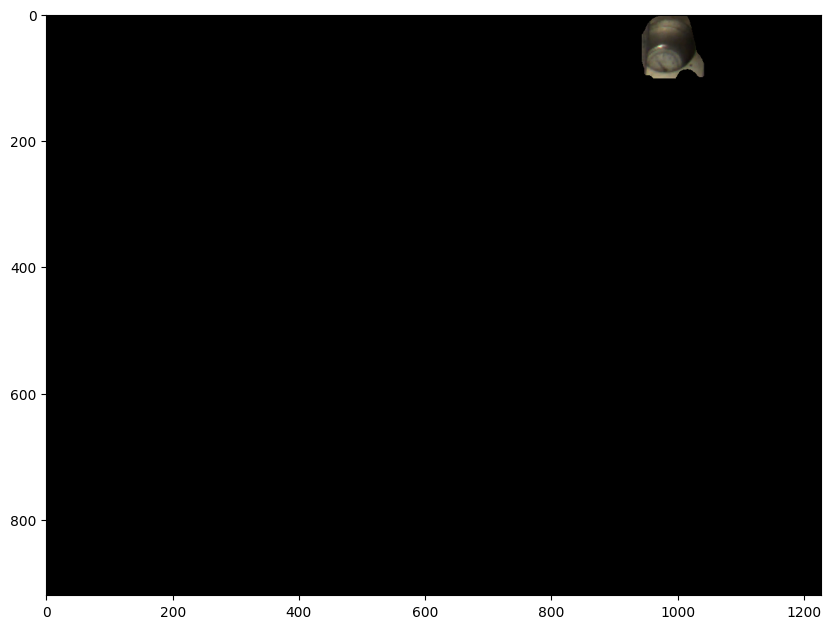

In [26]:
overlay = copy.deepcopy(sample1_frame)
res = cv2.bitwise_and(overlay, full_mask)
plt.figure(figsize=(10,10))
plt.imshow(res)

#### Video-2

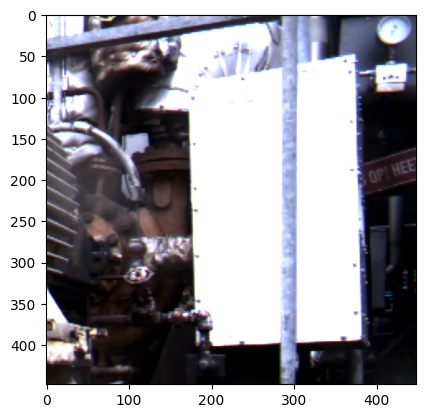

In [27]:
v_start = 0
h_sart = 780
slice_size = 448
slice_image = copy.deepcopy(sample2_frame[v_start:v_start+slice_size, h_sart:h_sart+slice_size])
plt.imshow(slice_image)

In [29]:
raw_image = Image.fromarray(slice_image)
result = paligemma_model.run_inference(raw_image, prompt='detect pressure gauge')
result

[{'content': '<loc0000><loc0909><loc0088><loc1013> pressure gauge',
  'xyxy': (398, 0, 443, 38),
  'mask': None,
  'name': 'pressure gauge'}]

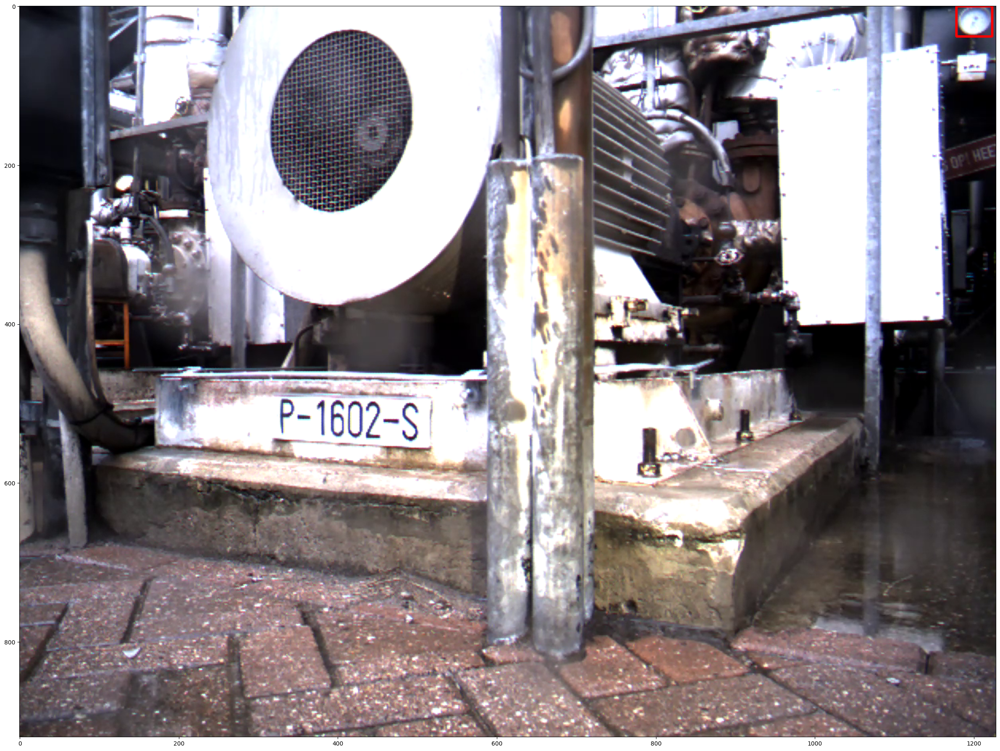

In [30]:
overlay = copy.deepcopy(sample2_frame)
x1, y1, x2, y2 = result[0]['xyxy']
x1_new, y1_new, x2_new, y2_new = x1+h_sart, y1+v_start, x2+h_sart, y2+v_start
cv2.rectangle(overlay, (int(x1_new), int(y1_new)), (int(x2_new), int(y2_new)), (255,0,0), 2) 
plt.figure(figsize=(30,30))
plt.imshow(overlay)

In [31]:
sample2_bbox = [x1_new, y1_new, x2_new, y2_new]
sample2_bbox # [1178, 0, 1223, 38]

[1178, 0, 1223, 38]

### Sliced inference

- In previous section we manually defined the slices. Now, we will try to automatically generate the slices and detect the pressure gauge in the image. 
- To enable this we have a very naive slice generator. This generator needs more work and for now its just to demostrate a POC. 

In [33]:
det_boxes = paligemma_model.run_sliced_inference(image=sample2_frame, 
                                                 prompt='detect pressure gauge',
                                                 horizontal_stride=448, 
                                                 vertical_stride=448, 
                                                 max_det_h=200, 
                                                 max_det_w=200)

In [35]:
len(det_boxes)

1

(-0.5, 1227.5, 919.5, -0.5)

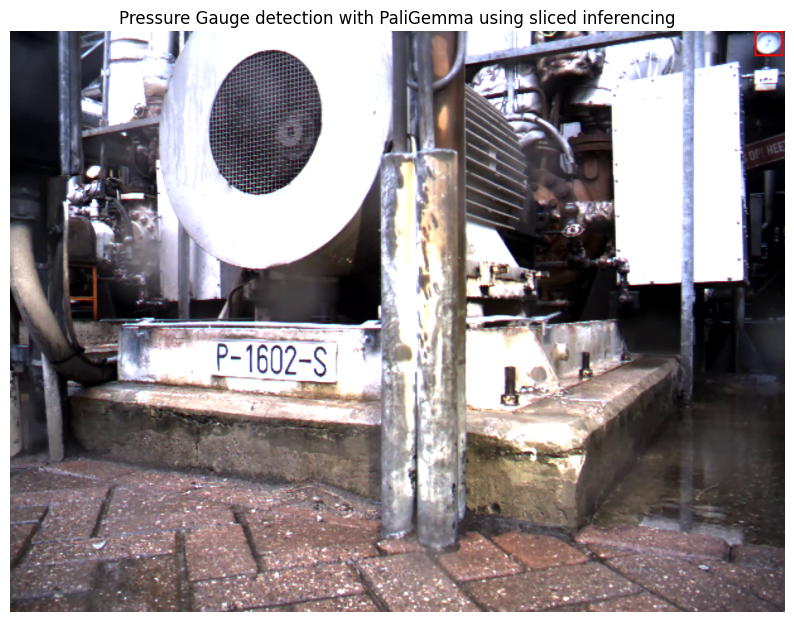

In [38]:
overlay = copy.deepcopy(sample2_frame)
for bbox in det_boxes:
    x1, y1, x2, y2 = bbox
    height = y2 - y1
    width = x2 - x1
    cv2.rectangle(overlay, (int(x1), int(y1)), (int(x2), int(y2)), (255,0,0), 2) 
plt.figure(figsize=(10,10))
plt.imshow(overlay)
plt.title('Pressure Gauge detection with PaliGemma using sliced inferencing')
plt.axis('off')

- We see a perfect pressure gauge is detected from the model in automated manner using sliced inferencing. 
- This is just a demo on one video, and the final algorithm will need more refinements over several scenarios. 
- Also, the PaliGemma Parser seems buggy and does not give the standard format output in many cases. This model is not yet production ready, and needs further improvments from the authors in the coming days. 

# Examine moving needle

- Here I am tagging as moving if the needle is moving atleast once in 1second i.e. 25frames. 
- This is configurable by varying the window_length parameter

## Experiment for solution

In [39]:
video_path = './data/pressure_gauge/needle_encoded.mp4'

In [40]:
gauge_bbox = [944, 0, 1043, 102]
x1, y1, x2, y2 = gauge_bbox

In [41]:
video_cap = cv2.VideoCapture(video_path)

In [42]:
num_frames = int(video_cap.get(cv2.CAP_PROP_FRAME_COUNT))
num_frames

123

In [43]:
# first let me collect all roi crops and study the properties. 

all_gauge_samples = []

frame_id = 33 # first 32 frames in video are blank frames

video_cap.set(cv2.CAP_PROP_POS_FRAMES, frame_id)

while True:
    ret, image_bgr = video_cap .read()
    if not ret:
        print(f'Cant read frame:{frame_id}')
        
    gauge_bgr = image_bgr[y1:y2, x1:x2]
    gauge_rgb = cv2.cvtColor(gauge_bgr, cv2.COLOR_BGR2RGB) 
    all_gauge_samples.append(gauge_rgb)
    
    frame_id += 1
    
    if frame_id>num_frames-1:
        break

In [44]:
all_gauge_samples = np.array(all_gauge_samples)

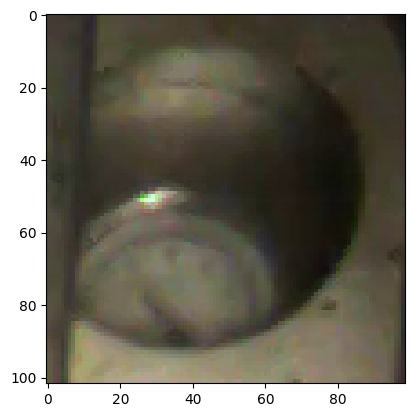

In [45]:
plt.imshow(all_gauge_samples[0])

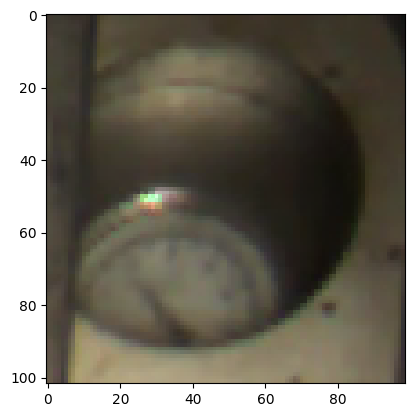

In [46]:
# Lets design a moving window based solution. 
# Consider a window of lenth L.
# when moving from frame i to i+L we collect all roi samples and store them in window.
# at frame i+L+1 we take absdiff between the avg_gauge from the window and current frame gauge. 
i = 5
window = 25
average_gauge = np.mean(all_gauge_samples[i:i+window], axis=0).astype(np.uint8)
plt.imshow(average_gauge)

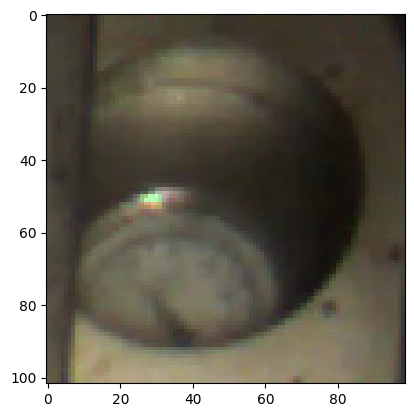

In [47]:
# next frame
plt.imshow(all_gauge_samples[i+window+1])

In [48]:
## Check diff between rgb-average and current-frame-rgb
diff = cv2.absdiff(average_gauge, all_gauge_samples[i+window+1])

# Compute the mean of the absolute difference
mean_diff = np.mean(diff)
mean_diff

2.3274905921964746

In [49]:
## Check diff between gray-average and current-frame-gray
diff = cv2.absdiff(cv2.cvtColor(average_gauge, cv2.COLOR_RGB2GRAY), 
                   cv2.cvtColor(all_gauge_samples[i+window+1], cv2.COLOR_RGB2GRAY))

# Compute the mean of the absolute difference
mean_diff = np.mean(diff)
mean_diff

1.665874430580313

In [50]:
## Check diff between consecutive frames
diff = cv2.absdiff(cv2.cvtColor(all_gauge_samples[i+window], cv2.COLOR_RGB2GRAY), 
                   cv2.cvtColor(all_gauge_samples[i+window+1], cv2.COLOR_RGB2GRAY))

# Compute the mean of the absolute difference
mean_diff = np.mean(diff)
mean_diff

0.47831253713606653

In [51]:
## We see that consecutive frames have a lower diff as the needle may not move considerable betweenn 2 consecutive frames.
## However between window average and current frame we see there is a difference, which means the needle is moving. 

## Run pipeline for sample-1

In [53]:
from src.predict_moving_needle import run_prediction

In [54]:
run_prediction(video_path='./data/pressure_gauge/needle_encoded.mp4',
              gauge_bbox=[944, 0, 1043, 102],
              output_path='./data/pressure_gauge/needle_result.mp4',
              window_length=25,
              start_frame_id=33,
              threshold=1)

## Run pipeline for sample-2

In [55]:
run_prediction(video_path='./data/pressure_gauge/needle2_encoded.mp4',
              gauge_bbox=[1178, 0, 1223, 38],
              output_path='./data/pressure_gauge/needle2_result.mp4',
              window_length=25,
              start_frame_id=3,
              threshold=1)